# Educational Process Mining

https://archive-beta.ics.uci.edu/dataset/346/educational+process+mining+epm+a+learning+analytics+data+set

Educational Process Mining (EPM): A Learning Analytics Data Set. (2015). UCI Machine Learning Repository.

## Summary of Cluster Analysis and Logistic Regression to model intermediate scores as pass/fail event
Clustering and Logistic Regression was performed for sessions 2 and 3.

Data from sessions 4 and 5 do not have an appropriate event-to-non-event ratio for Logisitic Regression, therefore, sessions 4 and 5 are excluded from this analysis. Session 6 is also excluded because that subset of data included an extra value for actv_grp that was not in the other sessions. This caused a difference in the number of features modeled, which meant the coefficients for session 6 could not be compared to the coefficients of the other sessions.

According to the documentation for the EPM data, the intermediate grades were assigned based on the work students completed during the sessions. Students were required to work during each session submit their work afterwards. Students were allowed to discuss concepts and ask for help during the sessions to complete the assignments. Intermediate grades were assigned based on a review of the submitted assignments.

It makes sense that the number of and time spent on activities and the mouse and keyboard activity as input features are capable of determining the outcome of the intermediate grades. Student behavior as measured by exercise activity and mouse and keyboard activity is directly related to the amount of work completed. While the amount of work does not guarantee quality work, little or no work cannot be quality work.

Two Elastic Net models were fit for each session dataset. 
* Additive model `interim_pass ~ sid + actv_grp + principle components`
* Interactive model `interim_pass ~ actv_grp * (principle components)**2`

The average hold-out set accuracy for the additive models is 1.0, which means the students and their behavior are perfect models. This makes sense because each student's ID was associated with their intermediate score. The interactive models attempted to eliminate this bias by exlcuding the student ID. The average hold-out set accuracy from the interactive models differs between the sessions.* Session 2 has a best score of 78%, and session 3 has a best score of 85%.

*_The difference is not as much as origionally thought. The accuracy improved for session 2 (was 70%) when the number of PCs increased from 8 to 12 to match the number used for session 3 so the models could be compared._

The best L1 ratio and C penalty differ between sessions 2 and 3:
* Session 2 interactive model: Lasso with li_ratio = 1 and a high regularization with C = 0.3012
* Session 2 interactive model: Closer to Ridge with l1_ratio = 0.25 and a higher regularization with C = 0.0907

The features that were turned off by the regularization also differ between sessions 2 and 3. Of the 231 features in the interactive models,
* 128 coefficients equaled 0 for both models
* 33 coefficients for session 2 equaled 0 while the corresponding coefficients for session 3 did not equal 0
* 20 coefficients for session 3 equaled 0 while the corresponding coefficients for session 2 did not equal 0
* 50 coefficients did not equal 0 for both models

The feature that is most important for session 3 was turned off for session 2. The feature that is most important for session 2 is 0.257 points higher than the corresponding coefficient for session 3, which is the 91st percentile of the differences.

The cluster analysis shows that the numeric input features are responsible for the separation of data points. For session 2, PC01 is responsible for separating points into clusters (hclust_a0) 0 and 2. In session 3, PC01 is responsible for separating points into clusters (hclust_a0) 1 and 2. The contribution plots for each session show that there are similarities and differences in which variables are associated with the principle components. For example, timepoints 80, 90, and 100 have the same variables, both `mcl` and `mm`. Bur for timepoint 40, session 2 shows that `mw`, `mcl`, `mcr`, and `mm` are associated with PC01 while session 3 shows that `total_ms`, `mw`, `mcl`, `mm`, and `ks` are associated with PC01.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
from IPython.display import Image, display

## Include functions
CMPINF2120_EPM_FUNC_INCL_Over_Lisa.ipynb includes functions used in this notebook.

In [3]:
%run CMPINF2120_EPM_FUNC_INCL_Over_Lisa.ipynb

## Load the data from github repository

In [4]:
interim_sqrt_path = 'https://raw.githubusercontent.com/lisaover/CMPINF2120_project/main/tp_sqrt_inputs_interim_df.csv'

In [5]:
interim_sqrt_init = pd.read_csv(interim_sqrt_path)

In [6]:
interim_sqrt_init.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3642 entries, 0 to 3641
Data columns (total 83 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   sess                 3642 non-null   int64  
 1   sid                  3642 non-null   int64  
 2   actv_grp             3642 non-null   object 
 3   total_ms_tp000_sqrt  3642 non-null   float64
 4   mw_tp000_sqrt        3642 non-null   float64
 5   mwc_tp000_sqrt       3642 non-null   float64
 6   mcl_tp000_sqrt       3642 non-null   float64
 7   mcr_tp000_sqrt       3642 non-null   float64
 8   mm_tp000_sqrt        3642 non-null   float64
 9   ks_tp000_sqrt        3642 non-null   float64
 10  total_ms_tp010_sqrt  3642 non-null   float64
 11  mw_tp010_sqrt        3642 non-null   float64
 12  mwc_tp010_sqrt       3642 non-null   float64
 13  mcl_tp010_sqrt       3642 non-null   float64
 14  mcr_tp010_sqrt       3642 non-null   float64
 15  mm_tp010_sqrt        3642 non-null   f

In [7]:
interim_sqrt_init.isna().sum()

sess                   0
sid                    0
actv_grp               0
total_ms_tp000_sqrt    0
mw_tp000_sqrt          0
                      ..
mm_tp100_sqrt          0
ks_tp100_sqrt          0
interim_scr            0
max_interim_scr        0
interim_pass           0
Length: 83, dtype: int64

interim_sqrt_init['sid'] = interim_sqrt_init['sid'].astype('object')
interim_sqrt_init['sess'] = interim_sqrt_init['sess'].astype('object')

In [8]:
interim_sqrt_df = interim_sqrt_init.loc[interim_sqrt_init.sess.isin([2,3])].copy()

In [9]:
interim_sqrt_df.sess.unique()

array([2, 3])

In [10]:
sqrt_vars = get_var_list(interim_sqrt_df,['sqrt'])

In [11]:
totl_vars = get_var_list_b(interim_sqrt_df,['total'])
mw_vars = get_var_list_b(interim_sqrt_df,['mw_'])
mwc_vars = get_var_list_b(interim_sqrt_df,['mwc'])
mcl_vars = get_var_list_b(interim_sqrt_df,['mcl'])
mcr_vars = get_var_list_b(interim_sqrt_df,['mcr'])
mm_vars = get_var_list_b(interim_sqrt_df,['mm'])
ks_vars = get_var_list_b(interim_sqrt_df,['ks'])

In [12]:
features_df = interim_sqrt_df.loc[:, sqrt_vars].copy()

In [13]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1337 entries, 0 to 1336
Data columns (total 77 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   total_ms_tp000_sqrt  1337 non-null   float64
 1   mw_tp000_sqrt        1337 non-null   float64
 2   mwc_tp000_sqrt       1337 non-null   float64
 3   mcl_tp000_sqrt       1337 non-null   float64
 4   mcr_tp000_sqrt       1337 non-null   float64
 5   mm_tp000_sqrt        1337 non-null   float64
 6   ks_tp000_sqrt        1337 non-null   float64
 7   total_ms_tp010_sqrt  1337 non-null   float64
 8   mw_tp010_sqrt        1337 non-null   float64
 9   mwc_tp010_sqrt       1337 non-null   float64
 10  mcl_tp010_sqrt       1337 non-null   float64
 11  mcr_tp010_sqrt       1337 non-null   float64
 12  mm_tp010_sqrt        1337 non-null   float64
 13  ks_tp010_sqrt        1337 non-null   float64
 14  total_ms_tp020_sqrt  1337 non-null   float64
 15  mw_tp020_sqrt        1337 non-null   f

In [14]:
feature_names = features_df.columns

In [15]:
len(feature_names)

77

In [16]:
interim_sqrt_df.loc[interim_sqrt_df.sess==2].actv_grp.unique()

array(['Aulaweb', 'Blank', 'Deeds', 'Diagram', 'Other', 'Properties',
       'Study', 'TextEditor', 'FSM_Related', 'Study_Materials'],
      dtype=object)

In [17]:
interim_sqrt_df.loc[interim_sqrt_df.sess==2].actv_grp.nunique()

10

In [18]:
interim_sqrt_df.loc[interim_sqrt_df.sess==3].actv_grp.unique()

array(['Aulaweb', 'Blank', 'Deeds', 'Diagram', 'Other', 'Properties',
       'Study', 'TextEditor', 'FSM_Related', 'Study_Materials'],
      dtype=object)

In [19]:
interim_sqrt_df.loc[interim_sqrt_df.sess==3].actv_grp.nunique()

10

In [20]:
interim_sqrt_df.loc[interim_sqrt_df.sess==4].actv_grp.unique()

array([], dtype=object)

In [21]:
interim_sqrt_df.loc[interim_sqrt_df.sess==4].actv_grp.nunique()

0

In [22]:
interim_sqrt_df.loc[interim_sqrt_df.sess==5].actv_grp.unique()

array([], dtype=object)

In [23]:
interim_sqrt_df.loc[interim_sqrt_df.sess==5].actv_grp.nunique()

0

In [24]:
interim_sqrt_df.loc[interim_sqrt_df.sess==6].actv_grp.unique()

array([], dtype=object)

In [25]:
interim_sqrt_df.loc[interim_sqrt_df.sess==6].actv_grp.nunique()

0

## Visualizations

#### Bar charts compare the number of events to non-events
Data from sessions 4 and 5 do not have an appropriate event-to-non-event ratio for Logisitic Regression and are excluded from evaluation.

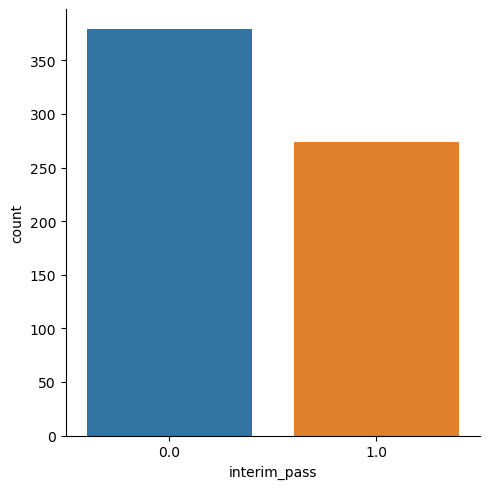

In [26]:
sns.catplot(data = interim_sqrt_df.loc[interim_sqrt_df['sess']==2], x='interim_pass', kind='count')

plt.show()

In [27]:
interim_sqrt_df.loc[interim_sqrt_df['sess']==2].interim_pass.mean()

0.41960183767228176

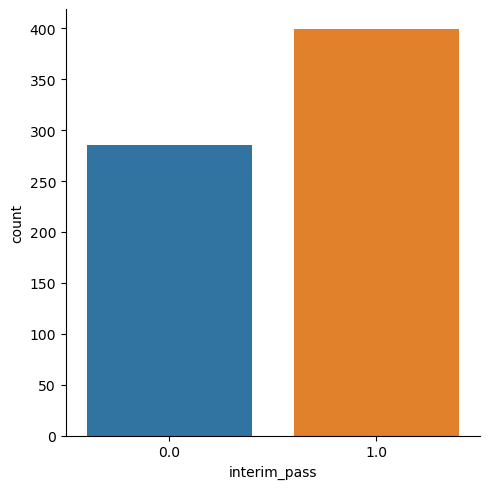

In [28]:
sns.catplot(data = interim_sqrt_df.loc[interim_sqrt_df['sess']==3], x='interim_pass', kind='count')

plt.show()

In [29]:
interim_sqrt_df.loc[interim_sqrt_df['sess']==3].interim_pass.mean()

0.5833333333333334

In [30]:
interim_sqrt_lf = interim_sqrt_df.melt(id_vars=['sess', 'sid', 'actv_grp', 'interim_scr', 'max_interim_scr', 'interim_pass'], value_vars=feature_names, ignore_index=True)

In [31]:
interim_sqrt_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102949 entries, 0 to 102948
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   sess             102949 non-null  int64  
 1   sid              102949 non-null  int64  
 2   actv_grp         102949 non-null  object 
 3   interim_scr      102949 non-null  float64
 4   max_interim_scr  102949 non-null  float64
 5   interim_pass     102949 non-null  float64
 6   variable         102949 non-null  object 
 7   value            102949 non-null  float64
dtypes: float64(4), int64(2), object(2)
memory usage: 6.3+ MB


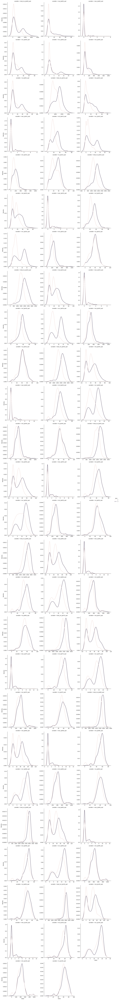

In [32]:
sns.displot(data = interim_sqrt_lf, x='value', hue='sess', col='variable', kind='kde',
            col_wrap=3, common_norm=False,
            facet_kws={'sharey': False, 'sharex': False})

plt.show()

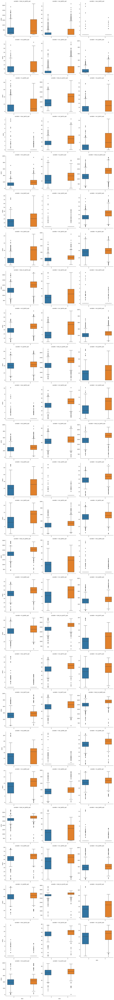

In [33]:
sns.catplot(data = interim_sqrt_lf, x='sess', y='value', col='variable', 
            col_wrap=3, hue='sess', 
            sharex=False, sharey=False, kind='box')

plt.show()

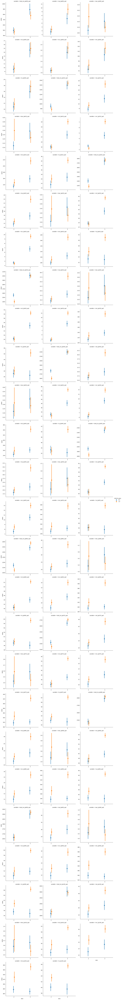

In [34]:
sns.catplot(data = interim_sqrt_lf, x='sess', y='value', hue='interim_pass',
            col='variable', kind='point', col_wrap=3, sharex=False,
            sharey=False, join=False, errorbar=('ci', 95), dodge=True)

plt.show()

In [35]:
sns.catplot(data = interim_sqrt_lf, x='sess', y='value', hue='interim_pass', col='actv_grp', 
            row='variable', kind='point', sharex=False,
            sharey=False, join=False, errorbar=('ci', 95), dodge=True)

plt.show()

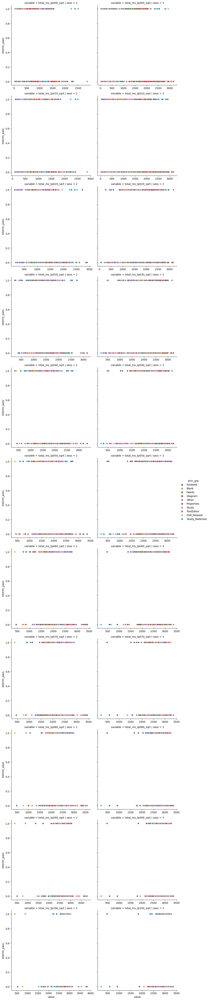

In [36]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(totl_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

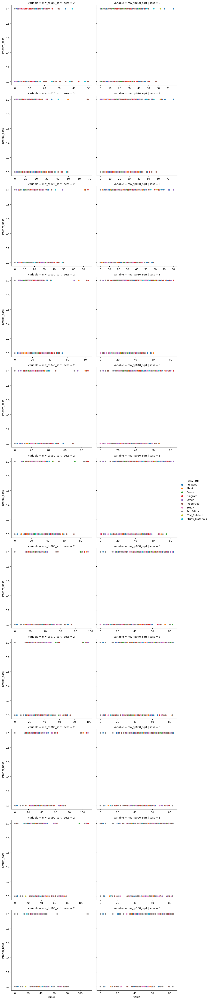

In [37]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(mw_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

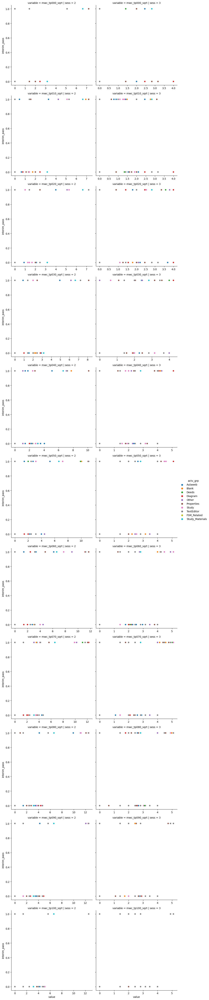

In [38]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(mwc_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

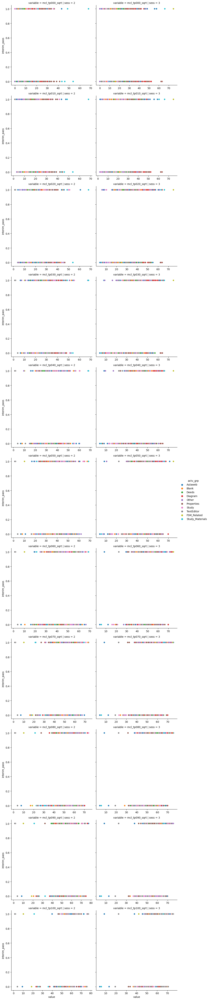

In [39]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(mcl_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

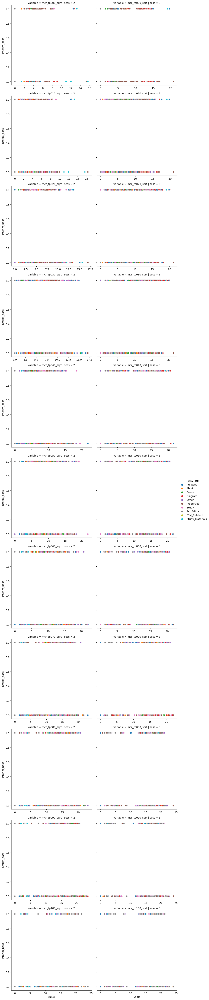

In [40]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(mcr_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

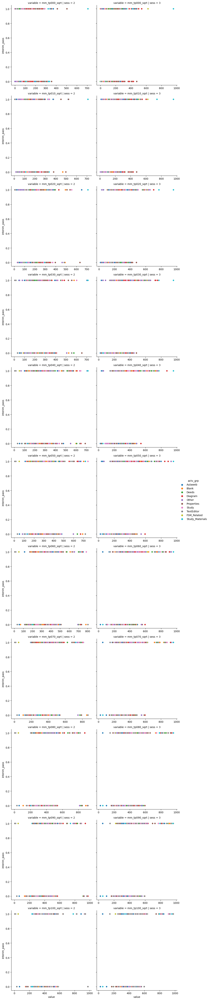

In [41]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(mm_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

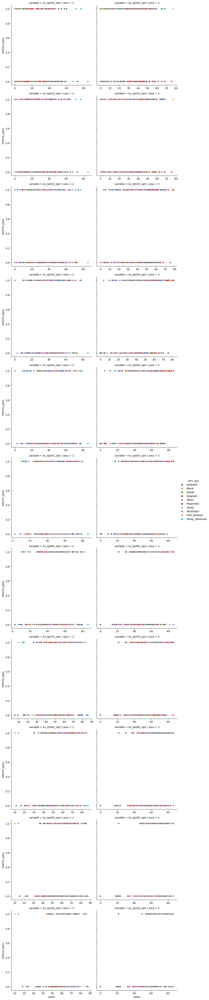

In [42]:
sns.relplot(data = interim_sqrt_lf.loc[interim_sqrt_lf['variable'].isin(ks_vars)], 
            x='value', y='interim_pass', row='variable', col='sess', kind='scatter',
            hue='actv_grp', facet_kws={'sharex': False})

plt.show()

## Session Comparison

#### Read stored variables from the separate cluster analysis and model results

In [43]:
%store -r s2_pc_scores_12_df
%store -r s2_pc_scores_outp_df
%store -r s2_additv_sid_model_coef
%store -r s2_interact_nosid_model_coef
%store -r s2_additv_sid_model_params
%store -r s2_interact_nosid_model_params
%store -r s2_additv_sid_model_score
%store -r s2_interact_nosid_model_score
%store -r s2_input_grid_copy
%store -r s2_input_grid_b_copy

In [44]:
%store -r s3_pc_scores_12_df
%store -r s3_pc_scores_outp_df
%store -r s3_interact_nosid_model_coef
%store -r s3_additv_sid_model_params
%store -r s3_interact_nosid_model_params
%store -r s3_additv_sid_model_score
%store -r s3_interact_nosid_model_score
%store -r s3_input_grid_copy
%store -r s3_input_grid_b_copy

### Compare the average hold-out set accuracy and best parameters for all models

In [45]:
mod_list = ['s2_additv', 's3_additv', 's2_interact', 's3_interact']

In [46]:
s3_additv_sid_model_params

{'enet__C': 121.51041751873476, 'enet__l1_ratio': 0.75}

In [47]:
model_accuracy = pd.DataFrame({'model': [m for m in mod_list],
                               'best_score': [s2_additv_sid_model_score,s3_additv_sid_model_score,s2_interact_nosid_model_score,s3_interact_nosid_model_score],
                               'best_enet__C': [s2_additv_sid_model_params['enet__C'], s3_additv_sid_model_params['enet__C'], s2_interact_nosid_model_params['enet__C'], s3_interact_nosid_model_params['enet__C']],
                               'best_enet__l1_ratio': [s2_additv_sid_model_params['enet__l1_ratio'], s3_additv_sid_model_params['enet__l1_ratio'], s2_interact_nosid_model_params['enet__l1_ratio'], s3_interact_nosid_model_params['enet__l1_ratio']]})

In [48]:
model_accuracy

,model,best_score,best_enet__C,best_enet__l1_ratio
0,s2_additv,1.000000,11.023176,0.25
1,s3_additv,1.000000,121.510418,0.75
2,s2_interact,0.779413,0.301194,1.00
3,s3_interact,0.852362,0.090718,0.25


### Compare the coefficients from the intereactive models (no `sid` in the model)

In [49]:
model_coef = pd.DataFrame({'s2_coef': s2_interact_nosid_model_coef[0].tolist(),
                          's3_coef': s3_interact_nosid_model_coef[0].tolist()})

In [50]:
model_coef['s2_coef_mag'] = [abs(i) for i in model_coef['s2_coef']]

In [51]:
model_coef['s3_coef_mag'] = [abs(i) for i in model_coef['s3_coef']]

In [52]:
model_coef

,s2_coef,s3_coef,s2_coef_mag,s3_coef_mag
0,0.000000,-0.995688,0.000000,0.995688
1,0.000000,-0.001171,0.000000,0.001171
2,-0.693616,-0.603058,0.693616,0.603058
3,0.568318,0.275209,0.568318,0.275209
4,0.000000,-0.053372,0.000000,0.053372
...,...,...,...,...
226,0.000000,0.000000,0.000000,0.000000
227,0.000000,0.000000,0.000000,0.000000
228,0.000000,0.000000,0.000000,0.000000
229,0.000000,0.000000,0.000000,0.000000


In [53]:
model_coef['both_zero'] = [1 if (i == 0) & (j == 0) else 0 for (i, j) in zip(model_coef['s2_coef'],model_coef['s3_coef'])]

In [54]:
model_coef['s2_zero'] = [1 if (i == 0) & (j != 0) else 0 for (i, j) in zip(model_coef['s2_coef'],model_coef['s3_coef'])]

In [55]:
model_coef['s3_zero'] = [1 if (i != 0) & (j == 0) else 0 for (i, j) in zip(model_coef['s2_coef'],model_coef['s3_coef'])]

In [56]:
model_coef['neither_zero'] = [1 if (i != 0) & (j != 0) else 0 for (i, j) in zip(model_coef['s2_coef'],model_coef['s3_coef'])]

In [57]:
model_coef.shape

(231, 8)

In [58]:
model_coef['both_zero'].sum()

128

In [59]:
model_coef['s2_zero'].sum()

33

In [60]:
model_coef['s3_zero'].sum()

20

In [61]:
model_coef['neither_zero'].sum()

50

In [62]:
model_coef['abs_diff'] = [abs(i - j) for (i, j) in zip(model_coef['s2_coef_mag'],model_coef['s3_coef_mag'])]

In [63]:
model_coef['abs_diff_pct_rank'] = model_coef.abs_diff.rank(pct=True)

In [64]:
model_coef.s2_coef.max()

0.8007527711556421

In [65]:
model_coef.s3_coef.max()

0.4817580527795798

In [66]:
model_coef.loc[(model_coef.s2_coef_mag == model_coef.s2_coef_mag.max()) | (model_coef.s3_coef_mag == model_coef.s3_coef_mag.max())]
               

,s2_coef,s3_coef,s2_coef_mag,s3_coef_mag,both_zero,s2_zero,s3_zero,neither_zero,abs_diff,abs_diff_pct_rank
0,0.000000,-0.995688,0.000000,0.995688,0,1,0,0,0.995688,1.00000
6,-1.161781,-0.904794,1.161781,0.904794,0,0,0,1,0.256987,0.91342


In [67]:
model_coef.describe()

,s2_coef,s3_coef,s2_coef_mag,s3_coef_mag,both_zero,s2_zero,s3_zero,neither_zero,abs_diff,abs_diff_pct_rank
count,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000
mean,-0.002789,-0.006126,0.069706,0.062044,0.554113,0.142857,0.086580,0.216450,0.070562,0.502165
std,0.177063,0.146957,0.162724,0.133296,0.498143,0.350687,0.281829,0.412719,0.134712,0.263544
min,-1.161781,-0.995688,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.279221
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.279221
50%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.279221
75%,0.000000,0.000000,0.057879,0.062019,1.000000,0.000000,0.000000,0.000000,0.091831,0.751082
max,0.800753,0.481758,1.161781,0.995688,1.000000,1.000000,1.000000,1.000000,0.995688,1.000000


### Compare Cluster Analysis

#### Session 2 contribution plot

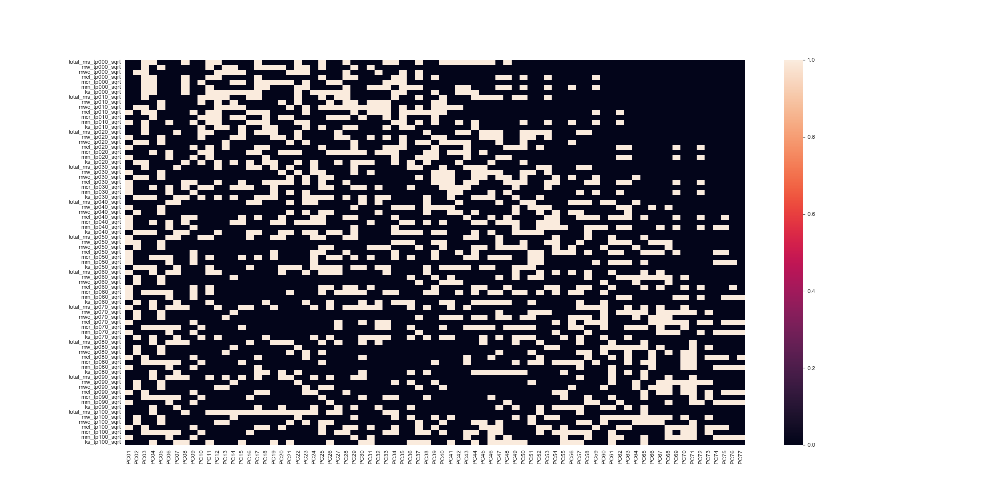

In [68]:
display(Image(filename='s2_pc_contrib.png'))

#### Session 3 contribution plot

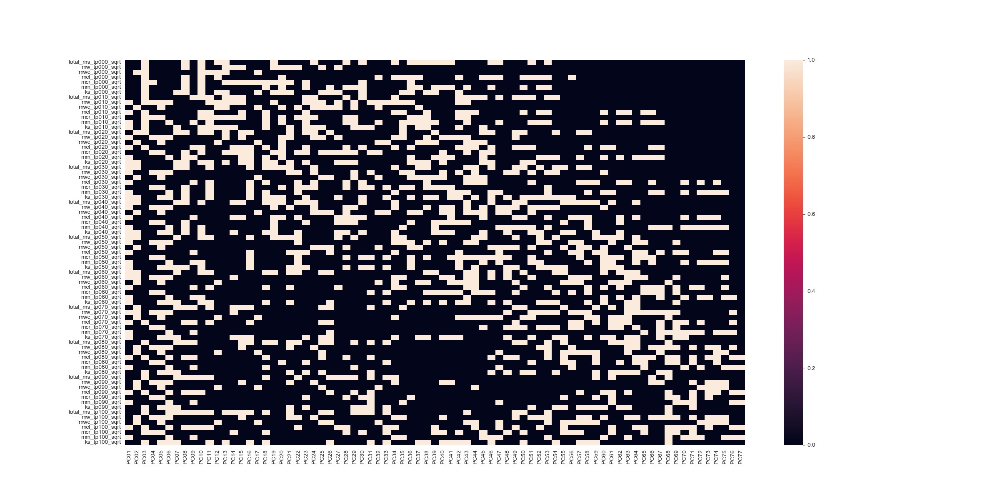

In [69]:
display(Image(filename='s3_pc_contrib.png'))

#### Session 2 clustering

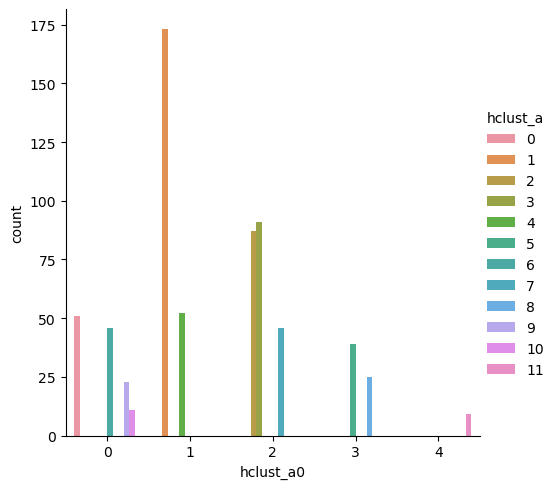

In [70]:
sns.catplot(data = s2_pc_scores_12_df, x='hclust_a0', hue='hclust_a', kind='count')

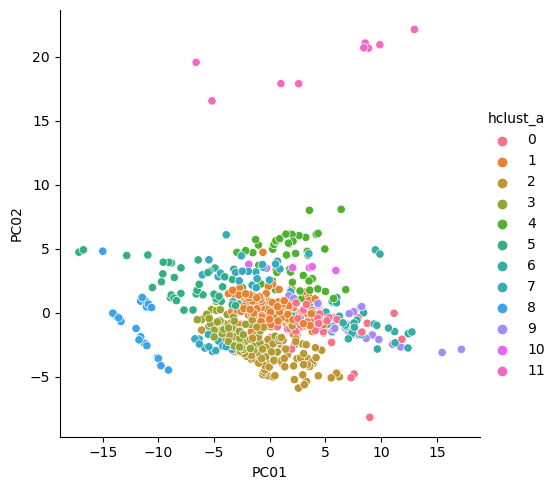

In [71]:
sns.relplot(data = s2_pc_scores_12_df, x='PC01', y='PC02', hue='hclust_a')

plt.show()

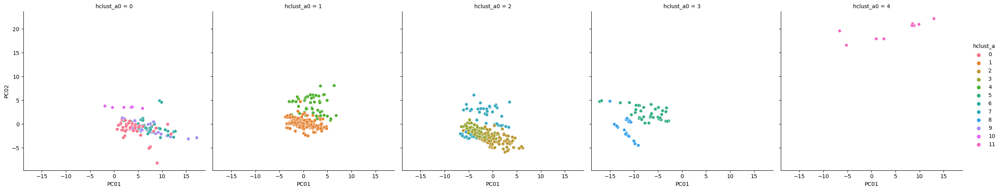

In [72]:
sns.relplot(data = s2_pc_scores_12_df, x='PC01', y='PC02', col='hclust_a0', hue='hclust_a')

plt.show()

#### Session 3 clustering

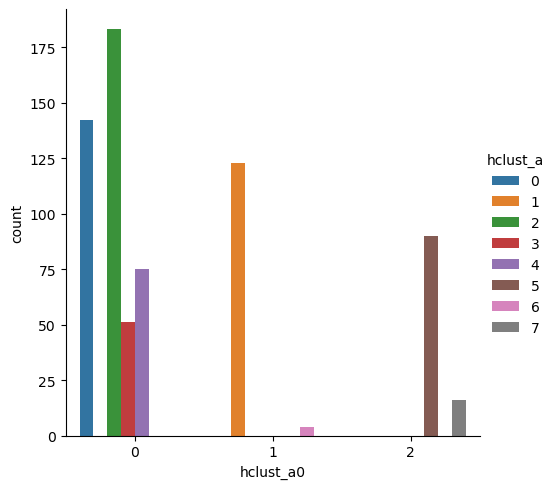

In [73]:
sns.catplot(data = s3_pc_scores_12_df, x='hclust_a0', hue='hclust_a', kind='count')

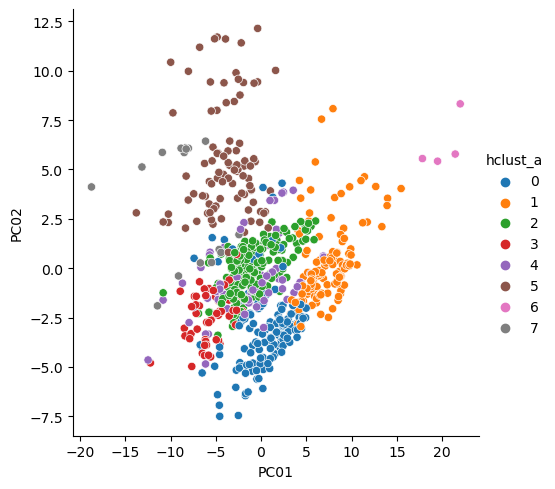

In [74]:
sns.relplot(data = s3_pc_scores_12_df, x='PC01', y='PC02', hue='hclust_a')

plt.show()

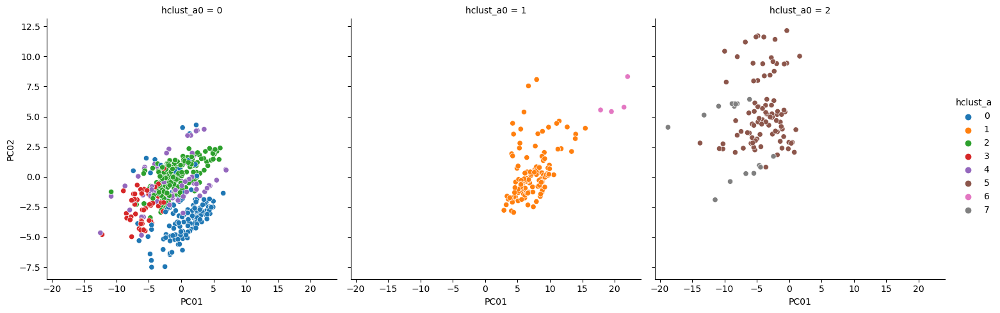

In [75]:
sns.relplot(data = s3_pc_scores_12_df, x='PC01', y='PC02', col='hclust_a0', hue='hclust_a')

plt.show()